In [1]:
import pandas as pd

In [3]:
citing_cited = pd.read_csv('./APS Data/aps-dataset-citations-2022.csv')

In [4]:
print(citing_cited)

                            citing_doi                          cited_doi
0        10.1103/PhysRevSeriesI.11.215         10.1103/PhysRevSeriesI.1.1
1        10.1103/PhysRevSeriesI.12.121       10.1103/PhysRevSeriesI.1.166
2          10.1103/PhysRevSeriesI.7.93       10.1103/PhysRevSeriesI.1.166
3        10.1103/PhysRevSeriesI.16.267        10.1103/PhysRevSeriesI.2.35
4         10.1103/PhysRevSeriesI.17.65       10.1103/PhysRevSeriesI.2.112
...                                ...                                ...
9833186    10.1103/PhysRevB.107.064202        10.1103/PhysRevB.106.214318
9833187    10.1103/PhysRevA.107.013525         10.1103/PhysRevX.12.041037
9833188    10.1103/PhysRevD.107.043032        10.1103/PhysRevD.106.124053
9833189    10.1103/PhysRevD.107.023524        10.1103/PhysRevD.106.124051
9833190    10.1103/PhysRevE.107.024126  10.1103/PhysRevResearch.4.L042051

[9833191 rows x 2 columns]


In [5]:
merged_table = pd.read_csv('./Created Data Tables/merged_table.csv')

In [6]:
print(merged_table)

         author_identifier                           doi    type  \
0                        0         10.1103/PhysRev.1.124  Person   
1                        3          10.1103/PhysRev.1.16  Person   
2                        7           10.1103/PhysRev.1.2  Person   
3                        9         10.1103/PhysRev.1.218  Person   
4                       12         10.1103/PhysRev.1.259  Person   
...                    ...                           ...     ...   
2528889            2571816  10.1103/RevModPhys.94.045008  Person   
2528890            2571817  10.1103/RevModPhys.94.045008  Person   
2528891            2571818  10.1103/RevModPhys.94.045008  Person   
2528892            2571819  10.1103/RevModPhys.94.045008  Person   
2528893            2571820  10.1103/RevModPhys.94.045008  Person   

                             name       firstname        surname  year  \
0               Lachlan Gilchrist         Lachlan      Gilchrist  1913   
1             David W. Cornelius.  

### Pairwise Comparisons

In [2]:
import tqdm
import pickle
import numpy as np
import matplotlib.pyplot as plt

In [8]:
# subset merged_table and citing_cited for "PhysRevE"
sampled_merged_table_physreve = merged_table[merged_table["doi"].str.contains("PhysRevE")]
sampled_citing_cited_physreve = citing_cited[citing_cited['citing_doi'].str.contains("PhysRevE")]

In [9]:
# group authors in sampled_merged_table and filter out groups with fewer than two DOIs
grouped_authors = sampled_merged_table_physreve.groupby('surname')['doi'].apply(list).reset_index()
grouped_authors = grouped_authors[grouped_authors['doi'].apply(len) > 1]

In [10]:
# function to retrieve citations for each group of authors
def retrieve_citations(group):
    # grouping name and doi
    author_name = group['surname']
    author_dois = group['doi']
    # subset citing_cited df based on author DOIs
    subset = sampled_citing_cited_physreve[sampled_citing_cited_physreve['citing_doi'].isin(author_dois)]
    return author_name, subset

In [11]:
# retrieve citations for each group of authors with progress bar
subsetted_citations = []

for _, group in tqdm.tqdm(grouped_authors.iterrows(), total=len(grouped_authors), desc="Processing Authors"):
    subsetted_citations.append(retrieve_citations(group))

Processing Authors: 100%|██████████| 20582/20582 [22:05<00:00, 15.52it/s]


In [12]:
# process each author's citations to create a binary matrix
pairwise_comparisons_surname = []

for author_name, subset_df in subsetted_citations:
    citing_dois = subset_df['citing_doi'].unique()
    cited_dois = subset_df['cited_doi'].unique()

    # create a df with citing_dois as rows and cited_dois as columns
    binary_matrix = pd.DataFrame(0, index=citing_dois, columns=cited_dois)

    # populate the binary matrix
    for citing_doi in citing_dois:
        cited_papers = subset_df[subset_df['citing_doi'] == citing_doi]['cited_doi']
        binary_matrix.loc[citing_doi, cited_papers] = 1

    pairwise_comparisons_surname.append((author_name, binary_matrix))

In [13]:
# save the pairwise_comparisons to a pickle file
pickle_filename = "./Surname Matching/pairwise_comparisons_surname.pkl"
with open(pickle_filename, "wb") as f:
    pickle.dump(pairwise_comparisons_surname, f)
print(f"Saved pairwise_comparisons to {pickle_filename}.")

Saved pairwise_comparisons to ./Surname Matching/pairwise_comparisons_surname.pkl.


In [14]:
# read the pairwise_comparisons_relaxed from a pickle file
pickle_filename = "./Surname Matching/pairwise_comparisons_surname.pkl"
with open(pickle_filename, 'rb') as f:
    pairwise_comparisons_surname = pickle.load(f)

pairwise_comparisons_surname

[('Aagesen',
                               10.1103/PhysRev.140.A1226  \
  10.1103/PhysRevE.101.022802                          1   
  10.1103/PhysRevE.98.023309                           0   
  
                               10.1103/PhysRevB.23.2334  \
  10.1103/PhysRevE.101.022802                         0   
  10.1103/PhysRevE.98.023309                          1   
  
                               10.1103/RevModPhys.57.437  \
  10.1103/PhysRevE.101.022802                          1   
  10.1103/PhysRevE.98.023309                           0   
  
                               10.1103/PhysRevA.45.7424  \
  10.1103/PhysRevE.101.022802                         0   
  10.1103/PhysRevE.98.023309                          1   
  
                               10.1103/PhysRevE.53.5101  \
  10.1103/PhysRevE.101.022802                         0   
  10.1103/PhysRevE.98.023309                          1   
  
                               10.1103/PhysRevE.57.2602  \
  10.1103/PhysRevE.101

### Cosine Similarities 

In [ ]:
from multiprocessing import Pool, cpu_count

def cosine_similarity(v1, v2):
    norm_v1 = np.linalg.norm(v1)
    norm_v2 = np.linalg.norm(v2)
    product = np.dot(v1, v2)
    return product / (norm_v1 * norm_v2)

def compute_correlation_matrix(pair):
    author_name, binary_matrix = pair
    correlation_matrix = binary_matrix.T.corr(method=cosine_similarity)
    return correlation_matrix

# determine the number of cores to use
num_cores = min(cpu_count(), 18)  

# use multiprocessing to parallelize the computation
if __name__ == "__main__":
    with Pool(num_cores) as pool:
        cosine_similarities_surname = list(tqdm.tqdm(pool.imap(compute_correlation_matrix, pairwise_comparisons_surname), total=len(pairwise_comparisons_surname)))

    # optionally save the result to a file
    with open('./Surname Matching/cosine_similarities_surname.pkl', 'wb') as f:
        pickle.dump(cosine_similarities_surname, f)

In [5]:
# read the citation_probabilities_relaxed from a pickle file
pickle_filename = "./Surname Matching/cosine_similarities_surname.pkl"
with open(pickle_filename, 'rb') as f:
    cosine_similarities_surname = pickle.load(f)

cosine_similarities_surname

[                             10.1103/PhysRevE.101.022802  \
 10.1103/PhysRevE.101.022802                      1.00000   
 10.1103/PhysRevE.98.023309                       0.09759   
 
                              10.1103/PhysRevE.98.023309  
 10.1103/PhysRevE.101.022802                     0.09759  
 10.1103/PhysRevE.98.023309                      1.00000  ,
                              10.1103/PhysRevE.96.062611  \
 10.1103/PhysRevE.96.062611                          1.0   
 10.1103/PhysRevE.102.062606                         0.0   
 
                              10.1103/PhysRevE.102.062606  
 10.1103/PhysRevE.96.062611                           0.0  
 10.1103/PhysRevE.102.062606                          1.0  ,
                             10.1103/PhysRevE.67.056116  \
 10.1103/PhysRevE.67.056116                    1.000000   
 10.1103/PhysRevE.71.056101                    0.424264   
 10.1103/PhysRevE.75.051127                    0.200000   
 10.1103/PhysRevE.63.051101           

In [6]:
# filter out cosine similarity matrices that have only one entry
cosine_similarities_surname_filtered = [author for author in cosine_similarities_surname if len(author) > 1]

# calculate the mean cosine similarity for each author based on their name similarity
mean_author_cosine_similarities = [(np.sum(author.values) - len(author)) / 2 / ((len(author) - 1) * len(author) / 2) for author in cosine_similarities_surname_filtered]

# convert the list of mean cosine similarities into a pandas Series 
mean_author_cosine_similarities_series = pd.Series(mean_author_cosine_similarities)

# calculate the lengths of the matrices where the mean cosine similarity is zero
lengths_of_matrices = [len(author) for author, similarity in zip(cosine_similarities_surname_filtered, mean_author_cosine_similarities) if similarity == 0]

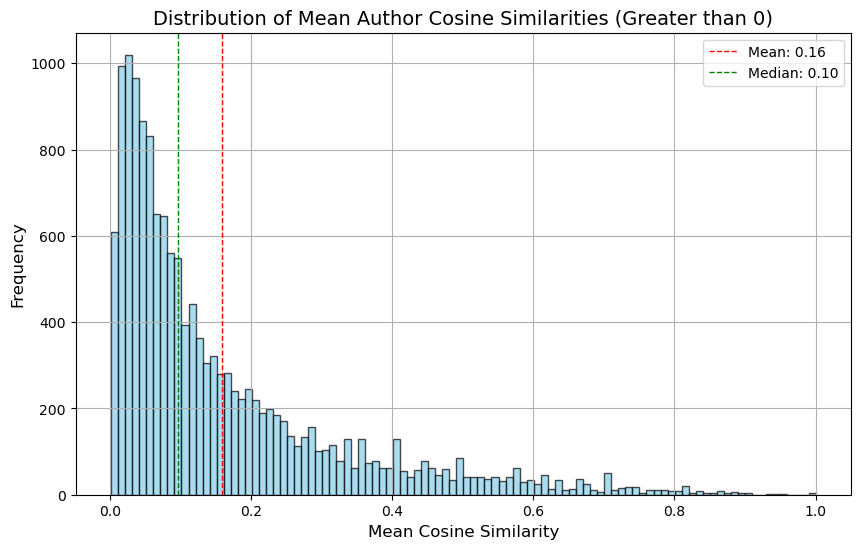

In [7]:
# filter the series for values greater than 0
filtered_series = mean_author_cosine_similarities_series[mean_author_cosine_similarities_series > 0]

# create the histogram plot
plt.figure(figsize=(10, 6))
plt.hist(filtered_series, bins=100, color='skyblue', edgecolor='black', alpha=0.7)
plt.title('Distribution of Mean Author Cosine Similarities (Greater than 0)', fontsize=14)
plt.xlabel('Mean Cosine Similarity', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.grid(True)

# add annotations for mean and median
mean_val = filtered_series.mean()
median_val = filtered_series.median()
plt.axvline(mean_val, color='red', linestyle='dashed', linewidth=1, label=f'Mean: {mean_val:.2f}')
plt.axvline(median_val, color='green', linestyle='dashed', linewidth=1, label=f'Median: {median_val:.2f}')

# add legend
plt.legend()

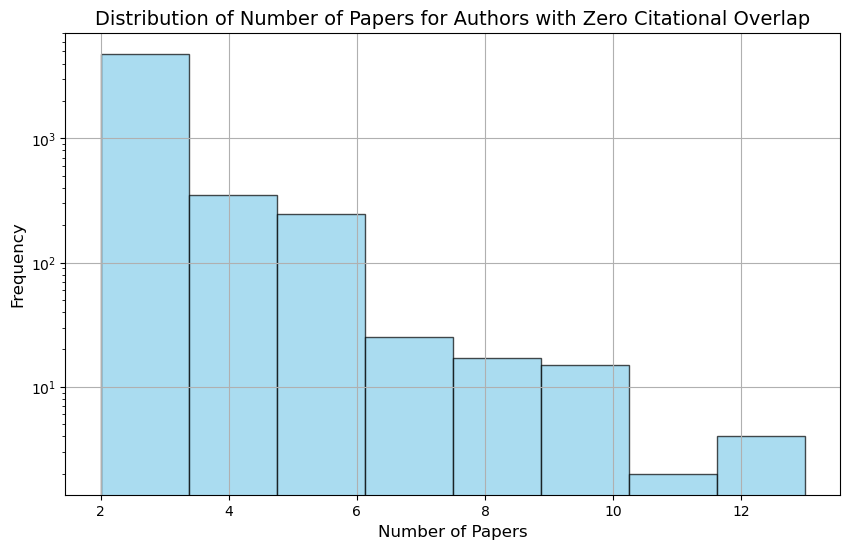

In [8]:
plt.figure(figsize=(10, 6))

plt.hist(lengths_of_matrices, bins=8, color='skyblue', edgecolor='black', alpha=0.7, log=True)
plt.title('Distribution of Number of Papers for Authors with Zero Citational Overlap', fontsize=14)
plt.xlabel('Number of Papers', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.grid(True)